## PROYECTO MÓDULO 3: Optimización de Talento

#### A partir de un CSV con datos de trabajadores debemos tratar los datos siguiendo los siguientes pasos:

1. Averiguar por qué se han marchado las empleadas de la empresa.
2. Si queremos más información o pistas podemos preguntarle a Rocío
3. FASES: 
    1. Hacer un EDA
    2. Transformar los datos (limpieza de nulos, normalización, etc.)
    3. Visualización de datos (hacer gráficas en Python). 
    4. BONUS: Diseño de base de datos e insertar los datos en SQL. 
    5. BONUS: Creación de ETL, hacer funciones para automatizar el proceso. 
    6. Hacer una presentación:
        - **Introducción, objetivos, pasos y organización**
        - Parte central: **análisis de los gráficas, tablas...**
        - **¿Qué info podemos obtener de estos? ¿Consejos para la empresa? ¿Mejoras? ¿Encontramos correlación entre variables?**
        - **Retos y soluciones**
        - **Conclusiones**
4. Aplicar metodología Agile y Srum. **Rocío** va a ser la clienta final: **Product Owner**


Calendario: 



![image.png](""C:\Users\almue\Desktop\Adalab\Módulo 3\Proyecto\Captura de pantalla 2025-05-23 120243.png"")

Preguntas para Rocío: 
¿En la columna de compromiso, qué es más comprometido, un 1 o un 4?

### PARTE 2: LIMPIEZA

In [1]:
#Importar librería
import pandas as pd
import numpy as np 


In [2]:
#Configuración de la visualización del DataFrame
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
#Lectura del CSV y transformación a DataFrame (df)
df=pd.read_csv("HR RAW DATA.csv", index_col =0)

### **DÍA 3: LIMPIEZA Y TRANSFORMACIÓN DE DATOS**

TIPS: 

- Eliminar info redundante, duplicados, eliminar columnas con demasiados nulos

- Homegeneizar columnas: cambiar nombre (todas a minúscula, con guion bajo, etc.)

- Poner el tipo de dato correcto a c ada columna

- Limpieza o reemplazo de caracteres

- Creación de columnas nuevas, normalmente basadas en otras

- Gestión de nulos: Para pasar nulos a % de nulos: (df_final.isnull().sum() / df_final.shape[0]) * 100

In [ ]:
# Diccionario para cambiar el nombre de las columnas a castellano y normalizar

nuevas_columnas = {
    "Age": "edad",
    "Attrition": "desvinculado",
    "BusinessTravel": "frecuencia_viaje",
    "DailyRate": "tarifa_diaria",
    "Department": "departamento",
    "DistanceFromHome": "distancia_domicilio",
    "Education": "nivel_estudios",
    "EducationField": "campo_estudios",
    "employeecount": "employeecount",
    "employeenumber": "numero_empleado",
    "EnvironmentSatisfaction": "nivel_satisfaccion_global",
    "Gender": "genero",
    "HourlyRate": "tarifa_hora",
    "JobInvolvement": "nivel_compromiso",
    "JobLevel": "categoria",
    "JobRole": "puesto",
    "JobSatisfaction": "nivel_satisfaccion_trabajo",
    "MaritalStatus": "estado_civil",
    "MonthlyIncome": "ingreso_mensual",
    "MonthlyRate": "tarifa_mensual",
    "NUMCOMPANIESWORKED": "trabajos_anteriores",
    "Over18": "over18",
    "OverTime": "horas_extras",
    "PercentSalaryHike": "%_incremento_salarial",
    "PerformanceRating": "evaluacion_desempeño",
    "RelationshipSatisfaction": "nivel_satisfaccion_relaciones",
    "StandardHours": "tipo_jornada",
    "StockOptionLevel": "acceso_acciones_empresa",
    "TOTALWORKINGYEARS": "años_en_activo",
    "TrainingTimesLastYear": "formaciones_ultimo_año",
    "WORKLIFEBALANCE": "nivel_satisfaccion_conciliacion",
    "YearsAtCompany": "antigüedad_empresa",
    "YearsInCurrentRole": "años_puesto_actual",
    "YearsSinceLastPromotion": "años_ultimo_ascenso",
    "YEARSWITHCURRMANAGER": "años_mismo_responsable",
    "SameAsMonthlyIncome": "recibe_mismo_salario",
    "DateBirth": "año_nacimiento",
    "Salary": "salario",
    "RoleDepartament": "rol_y_departamento",
    "NUMBERCHILDREN": "hijos",
    "RemoteWork": "teletrabajo"
}

In [5]:
# Aplica diccionario para cambiar el nombre de las columnas

df.rename(columns = nuevas_columnas, inplace = True)

In [ ]:
# Ordena las columnas de forma más lógica

df = df[[
    "numero_empleado",
    "desvinculado",
    "genero",
    "edad",
    "año_nacimiento",
    "estado_civil",
    "nivel_estudios",
    "campo_estudios",
    "frecuencia_viaje",
    "distancia_domicilio",
    "teletrabajo",
    "tipo_jornada",
    "formaciones_ultimo_año",
    "trabajos_anteriores",
    "años_en_activo",
    "antigüedad_empresa",
    "años_ultimo_ascenso",
    "años_mismo_responsable",
    "años_puesto_actual",
    "departamento",
    "rol_y_departamento",
    "categoria",
    "puesto",
    "horas_extras",
    "evaluacion_desempeño",
    "tarifa_hora",
    "tarifa_diaria",
    "tarifa_mensual",
    "ingreso_mensual",
    "%_incremento_salarial",
    "recibe_mismo_salario",
    "acceso_acciones_empresa",
    "nivel_compromiso",
    "nivel_satisfaccion_global",
    "nivel_satisfaccion_trabajo",
    "nivel_satisfaccion_relaciones",
    "nivel_satisfaccion_conciliacion",
    "employeecount",
    "over18",
    "salario",
    "hijos"
]]

In [7]:
# Elimina columnas identificadas como innecesarias

df.drop(["employeecount","over18","salario","hijos", "años_puesto_actual", "rol_y_departamento", "recibe_mismo_salario"], axis = 1, inplace = True)

In [9]:
# Localizamos los valores en letra para generar diccionario a número
df["edad"].sort_values(ascending=False)

1198      twenty-six
1325     twenty-four
1584      thirty-two
1293      thirty-two
216       thirty-six
1226    thirty-seven
426       thirty-one
593           thirty
31       forty-seven
411        fifty-two
357       fifty-five
79       fifty-eight
1423              60
399               60
198               60
38                60
930               60
668               59
1206              59
405               59
727               59
1227              59
821               59
609               59
1265              59
6                 59
852               59
1459              58
1473              58
690               58
228               58
1258              58
166               58
152               58
1340              58
1336              58
1130              58
16                58
81                58
1348              58
1024              58
1298              57
883               57
157               57
677               57
1524              57
566               56
563          

In [10]:
# Creamos un diccionario para pasar las edades en letra a número

numeros_en_letras = {
    'fifty-eight': 58,
    'fifty-five': 55,
    'fifty-two': 52,
    'forty-seven': 47,
    'thirty': 30,
    'thirty-one': 31,
    'thirty-seven': 37,
    'thirty-six': 36,
    'thirty-two': 32,
    'twenty-four': 24,
    'twenty-six': 26
}

In [11]:
# Aplicamos el diccionario a la columna "edad" del df

df["edad"] = df["edad"].replace(numeros_en_letras)

In [16]:
# Guardamos el df en un nuevo fichero csv para salvar las modificaciones realizadas

df.to_csv("HR_RAW_v1.csv")

In [25]:
# Abrimos el fichero guardado para seguir trabajando

df = pd.read_csv("HR_RAW_v1.csv", index_col = 0)
df.head(3)

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,"162,0",No,0,51,1972,NaN,3,NaN,NaN,6,Yes,NaN,5,7,NaN,20,15,15,NaN,5,resEArch DIREcToR,No,"3,0",51,"684,0$",6462,"19537,0",13,0,3,1,3,3,"3,0"
1,"259,0",No,0,52,1971,NaN,4,Life Sciences,NaN,1,1,NaN,5,0,"34,0",33,11,9,NaN,5,ManAGeR,NaN,"3,0",65,"699,0$",5678,"19999,0",14,1,2,3,3,1,"3,0"
2,"319,0",No,0,42,1981,Married,2,Technical Degree,travel_rarely,4,1,NaN,3,1,"22,0",22,11,15,Research & Development,5,ManaGER,No,"3,0",58,"532,0$",4933,"19232,0",11,0,3,3,4,4,NaN


### **DÍA 4: LIMPIEZA Y TRANSFORMACIÓN DE DATOS**

In [ ]:
# Lista con las columnas a aplicar e iteración para aplicar a cada una. 
# Son tipo object

lista_float = ['tarifa_diaria', 'ingreso_mensual']

# Generamos función para quitar errores de puntuación y cambiar a float

def pasar_a_float (columna):
        try: 
                return float(columna.replace("$", "").replace(".", "").replace(",", ".").strip())
        except: 
               return np.nan
   

In [ ]:
# Iteramos la función sobre la lista con las columnas a pasar de object a float

for i in lista_float:
    df[i] = df[i].apply(pasar_a_float)

In [ ]:
# Comprobamos que el resultado es correcto

df[lista_float].dtypes

tarifa_diaria      float64
ingreso_mensual    float64
dtype: object

In [ ]:
#Cambiamos los 84 "Not Available" por nulos para poder gestionarlos como tal y cambiar la columna a numérica. 
 
df['tarifa_hora']=df['tarifa_hora'].replace("Not Available", None)
df['tarifa_hora']=df['tarifa_hora'].astype(float)
df['tarifa_hora'].isnull().sum()

84

In [36]:
# Comprobamos que el cambio se ha realizado correctamente

df['tarifa_hora'].dtype

dtype('float64')

In [ ]:
# Pasamos a positivo usando el valor absoluto de la columna "distancia_domicilio". A continuación lo cambiamos a float, pasamos el dato de millas a km y redondeamos a 2 decimales. 

df["distancia_domicilio"] = ((df["distancia_domicilio"].abs().astype(float))*1.60934).round(2)

In [ ]:
# Segunda opción para pasar a positivo antes de recordar que teníamos opción de sacar el valor absoluto

df.loc[df['distancia_domicilio'] < 0, 'distancia_domicilio'] = df.loc[df['distancia_domicilio'] < 0, 'distancia_domicilio'] * -1
df['distancia_domicilio']= df['distancia_domicilio'].astype(float)
df['distancia_domicilio']= df['distancia_domicilio']*1.60934
df['distancia_domicilio'] = df['distancia_domicilio'].round(2)

In [ ]:
# Comprobamos que el cambio se ha realizado correctamente

df['distancia_domicilio'].dtype

dtype('float64')

In [ ]:
# Guardamos

df.to_csv("HR_RAW_v1.csv")

In [ ]:
# Abrimos

df = pd.read_csv("HR_RAW_v1.csv", index_col = 0)
df.head(3)

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,"162,0",No,0,51,1972,NaN,3,NaN,NaN,9.66,Yes,NaN,5,7,NaN,20,15,15,NaN,5,resEArch DIREcToR,No,"3,0",51.0,684.0,6462,19537.0,13,0,3,1,3,3,"3,0"
1,"259,0",No,0,52,1971,NaN,4,Life Sciences,NaN,1.61,1,NaN,5,0,"34,0",33,11,9,NaN,5,ManAGeR,NaN,"3,0",65.0,699.0,5678,19999.0,14,1,2,3,3,1,"3,0"
2,"319,0",No,0,42,1981,Married,2,Technical Degree,travel_rarely,6.44,1,NaN,3,1,"22,0",22,11,15,Research & Development,5,ManaGER,No,"3,0",58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN


In [49]:
# Pasamos 2 columnas con texto mezclado a minúsculas

lista_minusculas= ['departamento','puesto']
for i in lista_minusculas:
    df[i] = df[i].str.lower().str.strip()

df[lista_minusculas]

,departamento,puesto
0,NaN,research director
1,NaN,manager
2,research & development,manager
3,NaN,research director
4,NaN,sales executive
5,research & development,manager
6,NaN,sales executive
7,NaN,sales executive
8,NaN,manager
9,NaN,research director


In [ ]:
# Guardamos

df.to_csv("HR_RAW_v1.csv")

### **Día 5**

In [82]:
# Abrimos

df = pd.read_csv("HR_RAW_v1.csv", index_col = 0)
df.head(3)

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,NaN,3,NaN,NaN,9.66,yes,NaN,5,7,NaN,20,15,15,NaN,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,NaN,4,Life Sciences,NaN,1.61,yes,NaN,5,0,34.0,33,11,9,NaN,5,manager,NaN,3.0,65.0,699.0,5678,19999.0,14,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel_rarely,6.44,yes,NaN,3,1,22.0,22,11,15,research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN


In [83]:
# Estas columnas están en tipo object y las necesitamos numéricas: 

lista_int = ['años_en_activo', 'evaluacion_desempeño', 'nivel_satisfaccion_conciliacion', 'numero_empleado']

# Creamos esta función para pasar las columnas a int sustituyendo el ,0

def pasar_a_int(valor):
    try:
        if isinstance(valor, str):
            valor = valor.replace(",0", "")
        return int(float(valor))  # por si viene como '3,0' o 3.0
    except:
        return np.nan

In [84]:
# Iteramos por la lista para aplicar la función: 

for col in lista_int:
    df[col] = df[col].apply(pasar_a_int).astype("Int64")

In [85]:
# Comprobamos el resultado

df[lista_int]

,años_en_activo,evaluacion_desempeño,nivel_satisfaccion_conciliacion,numero_empleado
0,<NA>,3,3,162
1,34,3,3,259
2,22,3,<NA>,319
3,<NA>,3,<NA>,<NA>
4,<NA>,3,3,<NA>
5,<NA>,3,3,1900
6,28,3,2,81
7,20,4,3,387
8,22,3,3,<NA>
9,21,3,4,999


In [86]:
df[lista_int].dtypes

años_en_activo                     Int64
evaluacion_desempeño               Int64
nivel_satisfaccion_conciliacion    Int64
numero_empleado                    Int64
dtype: object

In [89]:
#Cambiar la columna de Estado civil para normalizar datos: 

df['estado_civil'] = df['estado_civil'].str.lower().str.replace('marreid','married')
df['estado_civil'].sample(50)

6            NaN
77           NaN
482      married
848       single
215          NaN
663          NaN
109      married
422       single
89       married
113      married
329     divorced
208      married
517       single
55      divorced
1130     married
268          NaN
130          NaN
1529      single
1082     married
779          NaN
789       single
1053         NaN
1457     married
382          NaN
550      married
1449         NaN
986       single
333          NaN
399     divorced
33        single
1414         NaN
882       single
914          NaN
117          NaN
1076      single
1316      single
798     divorced
1123         NaN
1279         NaN
1048    divorced
116      married
286       single
1475     married
338          NaN
1448     married
1501    divorced
744      married
1180      single
1511     married
123          NaN
Name: estado_civil, dtype: object

In [ ]:
# Cambiar columna Género sustituyendo el 0 y 1 por hombre y mujer:
 
diccionario_genero = {0:'male', 1:'female'}
df['genero'] = df['genero'].astype(object).map(diccionario_genero)
df['genero'] 

In [ ]:
#Cambiar columna teletrabajo de forma que solo queden los valores yes y no: 

diccionario_teletrabajo= {'0':'no', '1':'yes','False':'no','True':'yes','Yes':'yes'}
df['teletrabajo']=df['teletrabajo'].map(diccionario_teletrabajo)
df['teletrabajo']

In [92]:
# Guardamos

df.to_csv("HR_RAW_v1.csv")

In [93]:
# Abrimos

df = pd.read_csv("HR_RAW_v1.csv", index_col = 0)
df.head(3)

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,NaN,3,NaN,NaN,9.66,yes,NaN,5,7,NaN,20,15,15,NaN,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,NaN,4,Life Sciences,NaN,1.61,yes,NaN,5,0,34.0,33,11,9,NaN,5,manager,NaN,3.0,65.0,699.0,5678,19999.0,14,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel_rarely,6.44,yes,NaN,3,1,22.0,22,11,15,research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN


In [ ]:
#Cambiar columna tipo de jornada sustituyendo 80 por part time: 

df['tipo_jornada']=df['tipo_jornada'].str.replace('80,0','part time')
df['tipo_jornada']

0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
5             NaN
6             NaN
7             NaN
8             NaN
9             NaN
10            NaN
11            NaN
12            NaN
13            NaN
14            NaN
15            NaN
16            NaN
17            NaN
18            NaN
19            NaN
20            NaN
21            NaN
22            NaN
23      part time
24            NaN
25      part time
26            NaN
27            NaN
28            NaN
29            NaN
30            NaN
31            NaN
32            NaN
33      part time
34            NaN
35            NaN
36            NaN
37            NaN
38            NaN
39      part time
40      part time
41            NaN
42            NaN
43      part time
44            NaN
45            NaN
46            NaN
47      part time
48      part time
49      part time
50            NaN
51      part time
52            NaN
53            NaN
54            NaN
55      pa

In [ ]:
# Cambiar columna nivel_satisfaccion_global para quedarnos con la decena en los valores superiores a 10:

df.loc[df['nivel_satisfaccion_global'] > 9, 'nivel_satisfaccion_global'] = df['nivel_satisfaccion_global'] // 10

In [69]:
# Comprobamos el resultado: 

df['nivel_satisfaccion_global'].max()

4

In [96]:
# Guardamos

df.to_csv("HR_RAW_v1.csv")

In [97]:
# Abrimos

df = pd.read_csv("HR_RAW_v1.csv", index_col = 0)
df.head(3)

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,NaN,3,NaN,NaN,9.66,yes,NaN,5,7,NaN,20,15,15,NaN,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,NaN,4,Life Sciences,NaN,1.61,yes,NaN,5,0,34.0,33,11,9,NaN,5,manager,NaN,3.0,65.0,699.0,5678,19999.0,14,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel_rarely,6.44,yes,NaN,3,1,22.0,22,11,15,research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN


# **GESTION DE NULOS**

In [126]:
#Sacamos el % de nulos: 

porc_nulos = ((df.isnull().sum() / df.shape[0]) * 100).round(2)
df_nulos = pd.DataFrame(porc_nulos, columns = ["%_nulos"])
df_nulos[df_nulos["%_nulos"] > 0]

,%_nulos
numero_empleado,26.70
estado_civil,40.33
campo_estudios,46.16
frecuencia_viaje,47.83
tipo_jornada,74.04
años_en_activo,32.59
años_puesto_actual,97.89
departamento,81.29
rol_y_departamento,81.29
horas_extras,41.88


<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>%_nulos</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>numero_empleado</th>
      <td>26.70</td>
    </tr>
    <tr>
      <th>estado_civil</th>
      <td>40.33</td>
    </tr>
    <tr>
      <th>campo_estudios</th>
      <td>46.16</td>
    </tr>
    <tr>
      <th>frecuencia_viaje</th>
      <td>47.83</td>
    </tr>
    <tr>
      <th>tipo_jornada</th>
      <td>74.04</td>
    </tr>
    <tr>
      <th>años_en_activo</th>
      <td>32.59</td>
    </tr>
    <tr>
      <th>años_puesto_actual</th>
      <td>97.89</td>
    </tr>
    <tr>
      <th>departamento</th>
      <td>81.29</td>
    </tr>
    <tr>
      <th>rol_y_departamento</th>
      <td>81.29</td>
    </tr>
    <tr>
      <th>horas_extras</th>
      <td>41.88</td>
    </tr>
    <tr>
      <th>evaluacion_desempeño</th>
      <td>12.08</td>
    </tr>
    <tr>
      <th>tarifa_hora</th>
      <td>5.20</td>
    </tr>
    <tr>
      <th>tarifa_diaria</th>
      <td>7.68</td>
    </tr>
    <tr>
      <th>ingreso_mensual</th>
      <td>52.23</td>
    </tr>
    <tr>
      <th>recibe_mismo_salario</th>
      <td>52.23</td>
    </tr>
    <tr>
      <th>nivel_satisfaccion_conciliacion</th>
      <td>6.69</td>
    </tr>
  </tbody>
</table>
</div>

In [128]:
df

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,años_puesto_actual,departamento,rol_y_departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,recibe_mismo_salario,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162,No,male,51,1972,NaN,3,NaN,NaN,9.66,yes,NaN,5,7,<NA>,20,15,15,NaN,NaN,NaN,5,research director,No,3,51.0,684.0,6462,19537.0,13,19537.0,0,3,1,3,3,3
1,259,No,male,52,1971,NaN,4,Life Sciences,NaN,1.61,yes,NaN,5,0,34,33,11,9,NaN,NaN,NaN,5,manager,NaN,3,65.0,699.0,5678,19999.0,14,19999.0,1,2,3,3,1,3
2,319,No,male,42,1981,married,2,Technical Degree,travel_rarely,6.44,yes,NaN,3,1,22,22,11,15,NaN,research & development,manager - research & development,5,manager,No,3,58.0,532.0,4933,19232.0,11,19232.0,0,3,3,4,4,<NA>
3,<NA>,No,female,47,1976,married,4,Medical,travel_rarely,3.22,no,NaN,2,3,<NA>,20,5,6,NaN,NaN,NaN,4,research director,NaN,3,82.0,359.0,26703,17169.0,19,17169.0,2,3,1,3,2,<NA>
4,<NA>,No,female,46,1977,divorced,3,Technical Degree,NaN,4.83,no,NaN,5,2,<NA>,19,2,8,NaN,NaN,NaN,4,sales executive,No,3,45.0,1319.0,7739,NaN,12,NaN,1,4,1,1,4,3
5,1900,No,female,48,1975,NaN,3,Medical,NaN,35.41,yes,NaN,3,3,<NA>,22,4,7,NaN,research & development,manager - research & development,4,manager,No,3,58.0,117.0,2437,17174.0,11,17174.0,1,3,4,4,2,3
6,81,No,female,59,1964,NaN,3,Life Sciences,NaN,40.23,yes,NaN,3,7,28,21,7,9,NaN,NaN,NaN,3,sales executive,NaN,3,99.0,1435.0,2354,NaN,11,NaN,0,3,1,1,4,2
7,387,No,male,42,1981,married,1,NaN,travel_rarely,1.61,no,NaN,3,1,20,20,11,6,NaN,NaN,NaN,2,sales executive,No,4,99.0,635.0,24532,NaN,25,NaN,0,3,2,3,3,3
8,<NA>,No,female,41,1982,married,5,NaN,NaN,3.22,yes,NaN,2,7,22,18,11,8,NaN,NaN,NaN,4,manager,No,3,91.0,1276.0,5626,16595.0,16,16595.0,1,3,2,1,2,3
9,999,No,male,41,1982,NaN,3,NaN,travel_frequently,14.48,no,NaN,2,2,21,18,0,11,NaN,NaN,NaN,5,research director,No,3,64.0,840.0,3735,NaN,17,NaN,1,3,1,3,2,4


In [ ]:
# frecuencia de viaje: cambiar nulos por 'non-travel'

df['frecuencia_viaje'] = df['frecuencia_viaje'].fillna('non-travel')
df['frecuencia_viaje'].isnull().sum()



0              non-travel
1              non-travel
2           travel_rarely
3           travel_rarely
4              non-travel
5              non-travel
6              non-travel
7           travel_rarely
8              non-travel
9       travel_frequently
10             non-travel
11          travel_rarely
12             non-travel
13          travel_rarely
14             non-travel
15          travel_rarely
16          travel_rarely
17          travel_rarely
18             non-travel
19          travel_rarely
20             non-travel
21             non-travel
22             non-travel
23             non-travel
24          travel_rarely
25             non-travel
26             non-travel
27             non-travel
28          travel_rarely
29             non-travel
30             non-travel
31             non-travel
32          travel_rarely
33             non-travel
34          travel_rarely
35          travel_rarely
36             non-travel
37             non-travel
38      trav

In [131]:
df['frecuencia_viaje'] =df['frecuencia_viaje'].str.replace('-',' ').str.replace('_',' ')

In [132]:
df['frecuencia_viaje']

0              non travel
1              non travel
2           travel rarely
3           travel rarely
4              non travel
5              non travel
6              non travel
7           travel rarely
8              non travel
9       travel frequently
10             non travel
11          travel rarely
12             non travel
13          travel rarely
14             non travel
15          travel rarely
16          travel rarely
17          travel rarely
18             non travel
19          travel rarely
20             non travel
21             non travel
22             non travel
23             non travel
24          travel rarely
25             non travel
26             non travel
27             non travel
28          travel rarely
29             non travel
30             non travel
31             non travel
32          travel rarely
33             non travel
34          travel rarely
35          travel rarely
36             non travel
37             non travel
38      trav

In [133]:
# Cambiar los nulos de la columna tipo jornada por 'full time': 

df['tipo_jornada'] = df['tipo_jornada'].fillna('full time')
df['tipo_jornada'].isnull().sum()


0

In [134]:
df['tipo_jornada']

0       full time
1       full time
2       full time
3       full time
4       full time
5       full time
6       full time
7       full time
8       full time
9       full time
10      full time
11      full time
12      full time
13      full time
14      full time
15      full time
16      full time
17      full time
18      full time
19      full time
20      full time
21      full time
22      full time
23      part time
24      full time
25      part time
26      full time
27      full time
28      full time
29      full time
30      full time
31      full time
32      full time
33      part time
34      full time
35      full time
36      full time
37      full time
38      full time
39      part time
40      part time
41      full time
42      full time
43      part time
44      full time
45      full time
46      full time
47      part time
48      part time
49      part time
50      full time
51      part time
52      full time
53      full time
54      full time
55      pa

In [136]:
df.to_csv("HR_v2_nulos.csv")


In [144]:
df = pd.read_csv("HR_v2_nulos.csv", index_col = 0)
df

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,años_puesto_actual,departamento,rol_y_departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,recibe_mismo_salario,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,NaN,3,NaN,non travel,9.66,yes,full time,5,7,NaN,20,15,15,NaN,NaN,NaN,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,19537.0,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,NaN,4,Life Sciences,non travel,1.61,yes,full time,5,0,34.0,33,11,9,NaN,NaN,NaN,5,manager,NaN,3.0,65.0,699.0,5678,19999.0,14,19999.0,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel rarely,6.44,yes,full time,3,1,22.0,22,11,15,NaN,research & development,manager - research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,19232.0,0,3,3,4,4,NaN
3,NaN,No,female,47,1976,married,4,Medical,travel rarely,3.22,no,full time,2,3,NaN,20,5,6,NaN,NaN,NaN,4,research director,NaN,3.0,82.0,359.0,26703,17169.0,19,17169.0,2,3,1,3,2,NaN
4,NaN,No,female,46,1977,divorced,3,Technical Degree,non travel,4.83,no,full time,5,2,NaN,19,2,8,NaN,NaN,NaN,4,sales executive,No,3.0,45.0,1319.0,7739,NaN,12,NaN,1,4,1,1,4,3.0
5,1900.0,No,female,48,1975,NaN,3,Medical,non travel,35.41,yes,full time,3,3,NaN,22,4,7,NaN,research & development,manager - research & development,4,manager,No,3.0,58.0,117.0,2437,17174.0,11,17174.0,1,3,4,4,2,3.0
6,81.0,No,female,59,1964,NaN,3,Life Sciences,non travel,40.23,yes,full time,3,7,28.0,21,7,9,NaN,NaN,NaN,3,sales executive,NaN,3.0,99.0,1435.0,2354,NaN,11,NaN,0,3,1,1,4,2.0
7,387.0,No,male,42,1981,married,1,NaN,travel rarely,1.61,no,full time,3,1,20.0,20,11,6,NaN,NaN,NaN,2,sales executive,No,4.0,99.0,635.0,24532,NaN,25,NaN,0,3,2,3,3,3.0
8,NaN,No,female,41,1982,married,5,NaN,non travel,3.22,yes,full time,2,7,22.0,18,11,8,NaN,NaN,NaN,4,manager,No,3.0,91.0,1276.0,5626,16595.0,16,16595.0,1,3,2,1,2,3.0
9,999.0,No,male,41,1982,NaN,3,NaN,travel frequently,14.48,no,full time,2,2,21.0,18,0,11,NaN,NaN,NaN,5,research director,No,3.0,64.0,840.0,3735,NaN,17,NaN,1,3,1,3,2,4.0


In [145]:
# Eliminamos 3 columnas: años_puesto_actual, rol_y_departamento y recibe_mismo_salario:
lista_eliminar = ['años_puesto_actual', 'rol_y_departamento', 'recibe_mismo_salario']
df.drop(lista_eliminar, axis = 1, inplace=True)

In [149]:
df

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,ns/nc,3,ns/nc,non travel,9.66,yes,full time,5,7,NaN,20,15,15,sin asignar,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,ns/nc,4,Life Sciences,non travel,1.61,yes,full time,5,0,34.0,33,11,9,sin asignar,5,manager,NaN,3.0,65.0,699.0,5678,19999.0,14,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel rarely,6.44,yes,full time,3,1,22.0,22,11,15,research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN
3,NaN,No,female,47,1976,married,4,Medical,travel rarely,3.22,no,full time,2,3,NaN,20,5,6,sin asignar,4,research director,NaN,3.0,82.0,359.0,26703,17169.0,19,2,3,1,3,2,NaN
4,NaN,No,female,46,1977,divorced,3,Technical Degree,non travel,4.83,no,full time,5,2,NaN,19,2,8,sin asignar,4,sales executive,No,3.0,45.0,1319.0,7739,NaN,12,1,4,1,1,4,3.0
5,1900.0,No,female,48,1975,ns/nc,3,Medical,non travel,35.41,yes,full time,3,3,NaN,22,4,7,research & development,4,manager,No,3.0,58.0,117.0,2437,17174.0,11,1,3,4,4,2,3.0
6,81.0,No,female,59,1964,ns/nc,3,Life Sciences,non travel,40.23,yes,full time,3,7,28.0,21,7,9,sin asignar,3,sales executive,NaN,3.0,99.0,1435.0,2354,NaN,11,0,3,1,1,4,2.0
7,387.0,No,male,42,1981,married,1,ns/nc,travel rarely,1.61,no,full time,3,1,20.0,20,11,6,sin asignar,2,sales executive,No,4.0,99.0,635.0,24532,NaN,25,0,3,2,3,3,3.0
8,NaN,No,female,41,1982,married,5,ns/nc,non travel,3.22,yes,full time,2,7,22.0,18,11,8,sin asignar,4,manager,No,3.0,91.0,1276.0,5626,16595.0,16,1,3,2,1,2,3.0
9,999.0,No,male,41,1982,ns/nc,3,ns/nc,travel frequently,14.48,no,full time,2,2,21.0,18,0,11,sin asignar,5,research director,No,3.0,64.0,840.0,3735,NaN,17,1,3,1,3,2,4.0


In [146]:
# Gestionamos los nulos de las columnas object

columnas_desconocido = ['estado_civil', 'campo_estudios']
for columna in columnas_desconocido:
    df[columna] = df[columna].fillna("ns/nc")
df[columnas_desconocido].isnull().sum()


estado_civil      0
campo_estudios    0
dtype: int64

In [148]:
# Gestionamos los nulos de las columnas object

df['departamento'] = df['departamento'].fillna("sin asignar")
df['departamento'].isnull().sum()

0

In [151]:
# Gestionamos los nulos de las columnas object

moda = df['horas_extras'].mode()[0]
df['horas_extras'] = df['horas_extras'].fillna(moda)
df['horas_extras'].isnull().sum()

0

In [152]:
df.to_csv("HR_v2_nulos.csv")


In [153]:
df = pd.read_csv("HR_v2_nulos.csv", index_col = 0)
df

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,ns/nc,3,ns/nc,non travel,9.66,yes,full time,5,7,NaN,20,15,15,sin asignar,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,ns/nc,4,Life Sciences,non travel,1.61,yes,full time,5,0,34.0,33,11,9,sin asignar,5,manager,No,3.0,65.0,699.0,5678,19999.0,14,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel rarely,6.44,yes,full time,3,1,22.0,22,11,15,research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN
3,NaN,No,female,47,1976,married,4,Medical,travel rarely,3.22,no,full time,2,3,NaN,20,5,6,sin asignar,4,research director,No,3.0,82.0,359.0,26703,17169.0,19,2,3,1,3,2,NaN
4,NaN,No,female,46,1977,divorced,3,Technical Degree,non travel,4.83,no,full time,5,2,NaN,19,2,8,sin asignar,4,sales executive,No,3.0,45.0,1319.0,7739,NaN,12,1,4,1,1,4,3.0
5,1900.0,No,female,48,1975,ns/nc,3,Medical,non travel,35.41,yes,full time,3,3,NaN,22,4,7,research & development,4,manager,No,3.0,58.0,117.0,2437,17174.0,11,1,3,4,4,2,3.0
6,81.0,No,female,59,1964,ns/nc,3,Life Sciences,non travel,40.23,yes,full time,3,7,28.0,21,7,9,sin asignar,3,sales executive,No,3.0,99.0,1435.0,2354,NaN,11,0,3,1,1,4,2.0
7,387.0,No,male,42,1981,married,1,ns/nc,travel rarely,1.61,no,full time,3,1,20.0,20,11,6,sin asignar,2,sales executive,No,4.0,99.0,635.0,24532,NaN,25,0,3,2,3,3,3.0
8,NaN,No,female,41,1982,married,5,ns/nc,non travel,3.22,yes,full time,2,7,22.0,18,11,8,sin asignar,4,manager,No,3.0,91.0,1276.0,5626,16595.0,16,1,3,2,1,2,3.0
9,999.0,No,male,41,1982,ns/nc,3,ns/nc,travel frequently,14.48,no,full time,2,2,21.0,18,0,11,sin asignar,5,research director,No,3.0,64.0,840.0,3735,NaN,17,1,3,1,3,2,4.0


In [154]:
#Gestionamos los nulos de las columnas tipo number: 

columnas_number_con_nulos = df[df.columns[df.isnull().any()]].select_dtypes(include = np.number).columns
for col in columnas_number_con_nulos:
    print(col.upper())
    display((df[col].value_counts() / df.shape[0])*100)

NUMERO_EMPLEADO


numero_empleado
482.0     0.123916
530.0     0.123916
507.0     0.123916
517.0     0.123916
522.0     0.123916
523.0     0.123916
525.0     0.123916
526.0     0.123916
544.0     0.123916
501.0     0.123916
725.0     0.123916
724.0     0.123916
722.0     0.123916
721.0     0.123916
717.0     0.123916
710.0     0.123916
502.0     0.123916
495.0     0.123916
747.0     0.123916
440.0     0.123916
734.0     0.123916
733.0     0.123916
728.0     0.123916
423.0     0.123916
424.0     0.123916
433.0     0.123916
447.0     0.123916
1140.0    0.123916
455.0     0.123916
460.0     0.123916
465.0     0.123916
470.0     0.123916
475.0     0.123916
478.0     0.123916
682.0     0.123916
663.0     0.123916
653.0     0.123916
1069.0    0.123916
389.0     0.123916
388.0     0.123916
381.0     0.123916
376.0     0.123916
1044.0    0.123916
1053.0    0.123916
1195.0    0.123916
621.0     0.123916
1185.0    0.123916
1162.0    0.123916
1161.0    0.123916
1160.0    0.123916
1157.0    0.123916
1131.0    0.123

AÑOS_EN_ACTIVO


años_en_activo
10.0    8.921933
8.0     5.328377
6.0     5.204461
9.0     4.275093
5.0     4.089219
7.0     3.469641
4.0     3.345725
1.0     3.283767
12.0    2.106568
3.0     1.982652
14.0    1.858736
13.0    1.858736
11.0    1.796778
15.0    1.734820
16.0    1.734820
20.0    1.734820
18.0    1.672862
21.0    1.425031
17.0    1.363073
2.0     1.301115
22.0    1.115242
19.0    1.053284
24.0    0.867410
23.0    0.805452
28.0    0.805452
26.0    0.495663
0.0     0.495663
29.0    0.371747
36.0    0.371747
25.0    0.371747
33.0    0.371747
37.0    0.309789
27.0    0.309789
31.0    0.247831
30.0    0.185874
32.0    0.185874
35.0    0.185874
40.0    0.185874
34.0    0.123916
38.0    0.061958
Name: count, dtype: float64

EVALUACION_DESEMPEÑO


evaluacion_desempeño
3.0    74.659232
4.0    13.258984
Name: count, dtype: float64

TARIFA_HORA


tarifa_hora
42.0     2.044610
66.0     1.982652
48.0     1.858736
84.0     1.796778
57.0     1.796778
54.0     1.734820
46.0     1.734820
98.0     1.734820
87.0     1.672862
92.0     1.672862
96.0     1.672862
72.0     1.672862
56.0     1.610905
79.0     1.610905
32.0     1.610905
86.0     1.548947
81.0     1.548947
52.0     1.548947
61.0     1.548947
83.0     1.486989
62.0     1.486989
51.0     1.486989
82.0     1.486989
43.0     1.425031
74.0     1.425031
77.0     1.425031
41.0     1.425031
94.0     1.425031
88.0     1.425031
73.0     1.425031
45.0     1.425031
60.0     1.363073
95.0     1.363073
78.0     1.363073
76.0     1.301115
59.0     1.301115
99.0     1.301115
80.0     1.301115
67.0     1.301115
91.0     1.239157
97.0     1.239157
75.0     1.239157
90.0     1.239157
85.0     1.239157
44.0     1.239157
49.0     1.239157
64.0     1.177200
55.0     1.177200
65.0     1.177200
71.0     1.177200
100.0    1.177200
39.0     1.177200
37.0     1.177200
36.0     1.115242
40.0     1.11524

TARIFA_DIARIA


tarifa_diaria
691.0     0.433705
329.0     0.433705
147.0     0.371747
408.0     0.371747
530.0     0.371747
827.0     0.309789
334.0     0.309789
1329.0    0.309789
1082.0    0.309789
1157.0    0.309789
1283.0    0.309789
906.0     0.309789
427.0     0.309789
950.0     0.309789
688.0     0.309789
303.0     0.247831
1003.0    0.247831
465.0     0.247831
715.0     0.247831
921.0     0.247831
1490.0    0.247831
1099.0    0.247831
1092.0    0.247831
977.0     0.247831
1018.0    0.247831
933.0     0.247831
430.0     0.247831
1225.0    0.247831
829.0     0.247831
1469.0    0.247831
575.0     0.247831
793.0     0.247831
895.0     0.247831
217.0     0.247831
805.0     0.247831
589.0     0.247831
654.0     0.247831
1276.0    0.247831
703.0     0.247831
201.0     0.247831
1485.0    0.247831
240.0     0.247831
661.0     0.247831
501.0     0.247831
482.0     0.247831
1229.0    0.247831
1107.0    0.247831
1180.0    0.247831
1495.0    0.185874
238.0     0.185874
142.0     0.185874
1277.0    0.18587

INGRESO_MENSUAL


ingreso_mensual
6347.0     0.247831
5304.0     0.247831
2657.0     0.185874
2258.0     0.185874
5405.0     0.123916
8224.0     0.123916
2610.0     0.123916
5731.0     0.123916
2539.0     0.123916
2376.0     0.123916
11713.0    0.123916
2216.0     0.123916
19189.0    0.123916
3452.0     0.123916
2070.0     0.123916
8793.0     0.123916
2587.0     0.123916
4960.0     0.123916
11159.0    0.123916
5396.0     0.123916
2782.0     0.123916
4197.0     0.123916
9434.0     0.123916
5337.0     0.123916
2741.0     0.123916
2791.0     0.123916
5828.0     0.123916
2909.0     0.123916
2033.0     0.123916
2821.0     0.123916
7756.0     0.123916
2042.0     0.123916
6632.0     0.123916
7587.0     0.123916
4335.0     0.123916
5980.0     0.123916
4244.0     0.123916
5228.0     0.123916
2700.0     0.123916
2380.0     0.123916
2404.0     0.123916
2377.0     0.123916
2366.0     0.123916
2329.0     0.123916
4294.0     0.123916
6725.0     0.123916
10325.0    0.123916
4447.0     0.123916
10845.0    0.123916
3420

NIVEL_SATISFACCION_CONCILIACION


nivel_satisfaccion_conciliacion
3.0    56.567534
2.0    22.242875
4.0     9.603470
1.0     4.894672
Name: count, dtype: float64

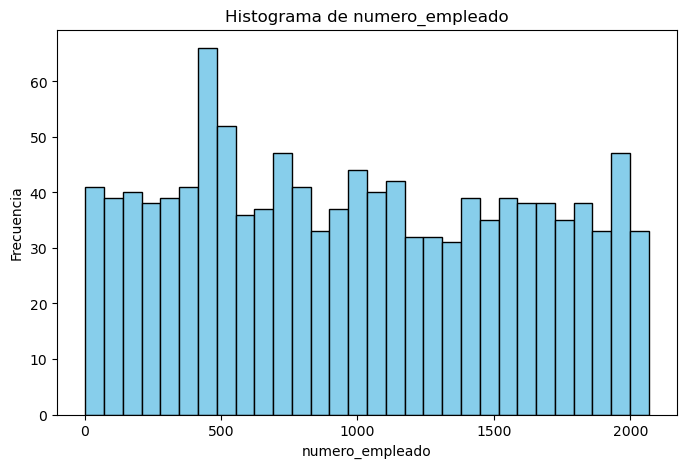

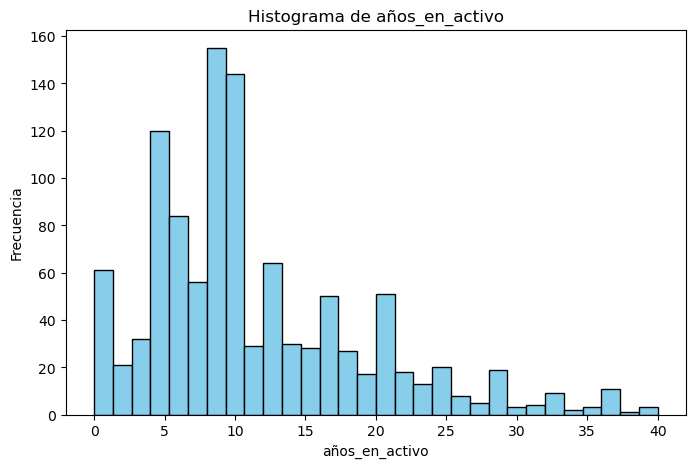

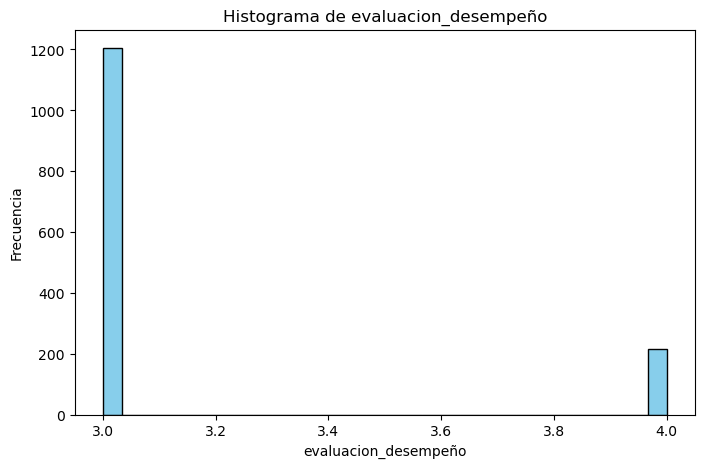

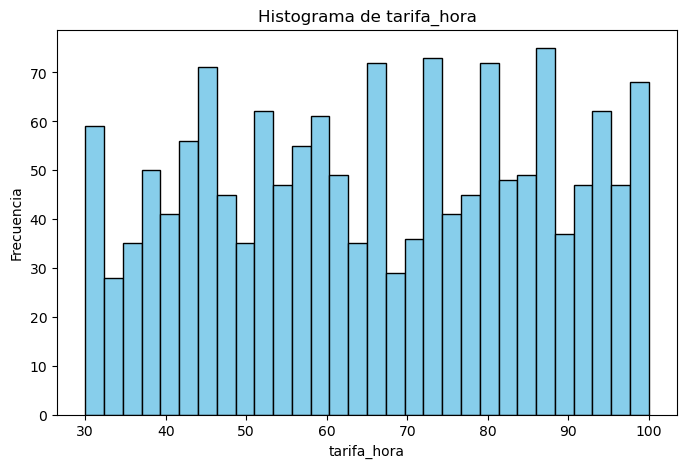

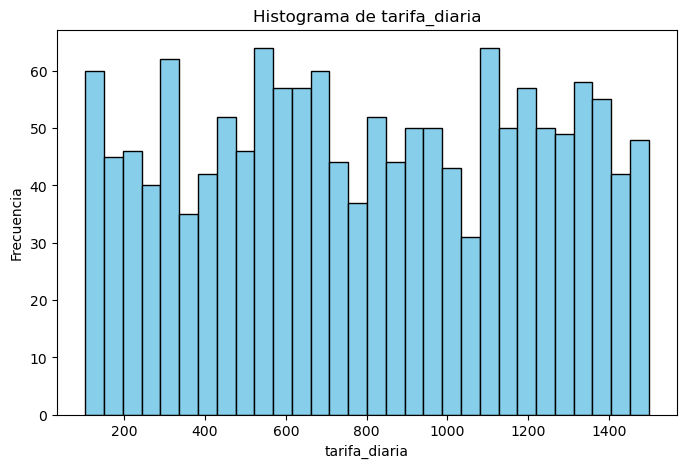

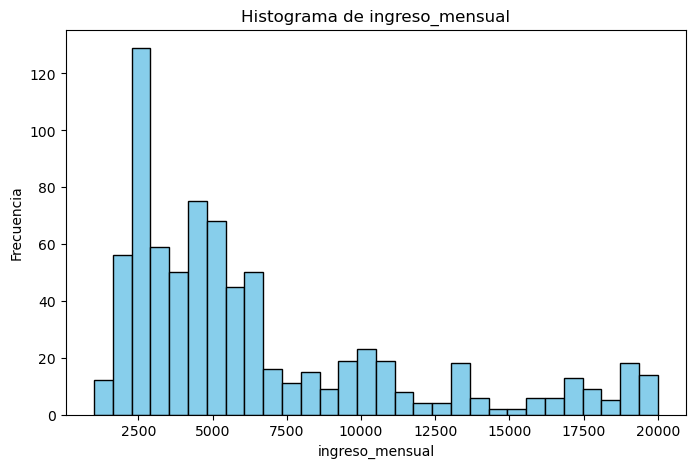

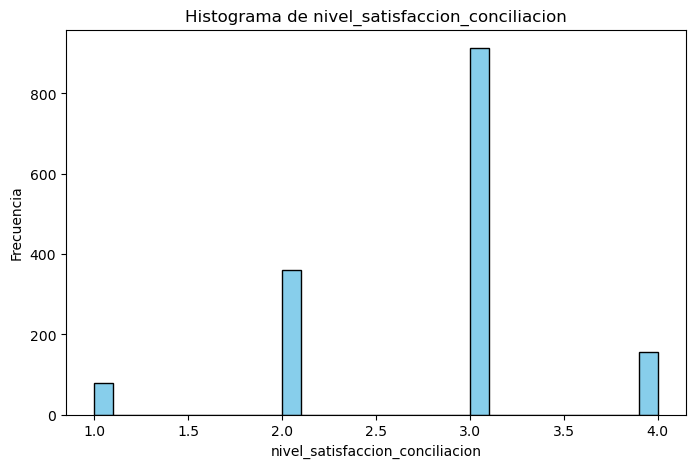

In [ ]:
# Creación gráficas para datos
import matplotlib.pyplot as plt
# Lista de columnas para las que quieres hacer histogramas

# Crear un histograma separado para cada columna
for col in list(columnas_number_con_nulos):
    plt.figure(figsize=(8, 5))
    plt.hist(df[col].dropna(), bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Histograma de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.show()

In [158]:
df.to_csv("HR_v2_nulos.csv")


In [159]:
df = pd.read_csv("HR_v2_nulos.csv", index_col = 0)
df

,numero_empleado,desvinculado,genero,edad,año_nacimiento,estado_civil,nivel_estudios,campo_estudios,frecuencia_viaje,distancia_domicilio,teletrabajo,tipo_jornada,formaciones_ultimo_año,trabajos_anteriores,años_en_activo,antigüedad_empresa,años_ultimo_ascenso,años_mismo_responsable,departamento,categoria,puesto,horas_extras,evaluacion_desempeño,tarifa_hora,tarifa_diaria,tarifa_mensual,ingreso_mensual,%_incremento_salarial,acceso_acciones_empresa,nivel_compromiso,nivel_satisfaccion_global,nivel_satisfaccion_trabajo,nivel_ satisfaccion_relaciones,nivel_satisfaccion_conciliacion
0,162.0,No,male,51,1972,ns/nc,3,ns/nc,non travel,9.66,yes,full time,5,7,NaN,20,15,15,sin asignar,5,research director,No,3.0,51.0,684.0,6462,19537.0,13,0,3,1,3,3,3.0
1,259.0,No,male,52,1971,ns/nc,4,Life Sciences,non travel,1.61,yes,full time,5,0,34.0,33,11,9,sin asignar,5,manager,No,3.0,65.0,699.0,5678,19999.0,14,1,2,3,3,1,3.0
2,319.0,No,male,42,1981,married,2,Technical Degree,travel rarely,6.44,yes,full time,3,1,22.0,22,11,15,research & development,5,manager,No,3.0,58.0,532.0,4933,19232.0,11,0,3,3,4,4,NaN
3,NaN,No,female,47,1976,married,4,Medical,travel rarely,3.22,no,full time,2,3,NaN,20,5,6,sin asignar,4,research director,No,3.0,82.0,359.0,26703,17169.0,19,2,3,1,3,2,NaN
4,NaN,No,female,46,1977,divorced,3,Technical Degree,non travel,4.83,no,full time,5,2,NaN,19,2,8,sin asignar,4,sales executive,No,3.0,45.0,1319.0,7739,NaN,12,1,4,1,1,4,3.0
5,1900.0,No,female,48,1975,ns/nc,3,Medical,non travel,35.41,yes,full time,3,3,NaN,22,4,7,research & development,4,manager,No,3.0,58.0,117.0,2437,17174.0,11,1,3,4,4,2,3.0
6,81.0,No,female,59,1964,ns/nc,3,Life Sciences,non travel,40.23,yes,full time,3,7,28.0,21,7,9,sin asignar,3,sales executive,No,3.0,99.0,1435.0,2354,NaN,11,0,3,1,1,4,2.0
7,387.0,No,male,42,1981,married,1,ns/nc,travel rarely,1.61,no,full time,3,1,20.0,20,11,6,sin asignar,2,sales executive,No,4.0,99.0,635.0,24532,NaN,25,0,3,2,3,3,3.0
8,NaN,No,female,41,1982,married,5,ns/nc,non travel,3.22,yes,full time,2,7,22.0,18,11,8,sin asignar,4,manager,No,3.0,91.0,1276.0,5626,16595.0,16,1,3,2,1,2,3.0
9,999.0,No,male,41,1982,ns/nc,3,ns/nc,travel frequently,14.48,no,full time,2,2,21.0,18,0,11,sin asignar,5,research director,No,3.0,64.0,840.0,3735,NaN,17,1,3,1,3,2,4.0
